# Wind Turbine
---

### Analysis

- Add your analysis here.
 

In [1]:
# Dependencies and Setup
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import scipy.stats as st
from scipy.stats import linregress
# from mapboxgl.utils import *
# from mapboxgl.viz import *
# from IPython.display import IFrame

#Data File(s)
wind_turbine = "turbinedata.csv"

# Read the turbine data
wind = pd.read_csv(wind_turbine)


# Combine the data into a single DataFrame
#pymaceuticals_complete = pd.merge(mouse_metadata, study_results, how="left", on=["Mouse ID", "Mouse ID"])


# Display the data table for preview
wind.head(5)

ModuleNotFoundError: No module named 'mapboxgl'

In [2]:
wind_turbine_clean_df = wind[['case_id', 't_state', 'p_name', 'p_year', 'p_tnum', 't_manu', 't_model', 't_cap', 
                                        't_hh', 't_rd', 't_ttlh', 't_conf_atr', 't_conf_loc', 'xlong', 'ylat']]
wind_turbine_clean_df = wind_turbine_clean_df.rename(columns={'case_id':'Turbine ID', 't_state':'State','p_name':'Project Name',
                                                             'p_tnum':'Turbines in Project','t_manu':'Manufacturer',
                                                              't_model':'Model Number','t_cap':'Capacity',
                                                              'p_year':'Year','t_hh':'Height','t_rd':'Rotor Diameter',
                                                              't_ttlh':'Total Height','xlong':'Longitude','ylat':'Latitude'
                                                              })
wind_turbine_clean_df

NameError: name 'wind' is not defined

In [2]:
# Checking the number of turbines.
turbine_count = len(pd.unique(wind['case_id']))
turbine_count

72731

In [3]:
# Checking the number of manufactures.
manu_count = len(pd.unique(wind['t_manu']))
manu_count

64

In [4]:
# Chekcing the number of models
model_count = len(pd.unique(wind['t_model']))
model_count

332

In [12]:
# Find the details of a specific wind turbine based on ID number
#specific_county = wind.loc[wind['t_county'] == 'Ellis County' ,:]
#specific_county

#sp_turbine = wind.loc[wind['case_id'] == '3123233' ,:]
new_wind = wind[['case_id','p_name','t_state','p_year','t_cap','t_manu','t_model','t_hh','xlong','ylat']]
new_wind

sp_turbine = new_wind.loc[new_wind["case_id"] == 3053439]
  
sp_turbine

,case_id,p_name,t_state,p_year,t_cap,t_manu,t_model,t_hh,xlong,ylat
40108,3053439,Method Manufacturing Plant,IL,2015.0,600.0,NEG Micon,NM48,45.0,-87.601456,41.698063


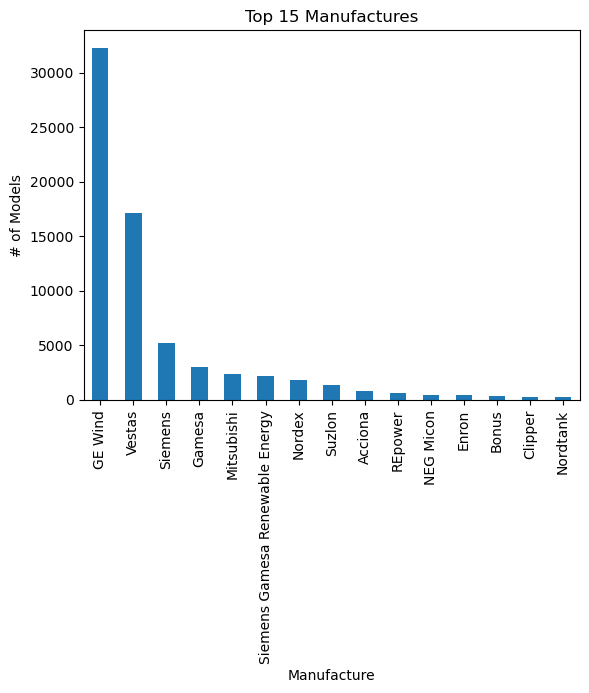

In [7]:
#Find top 15 turbine manufactures and plot the output
turbine_manu = wind["t_manu"].value_counts().head(15)
turbine_manu

turbine_manu.plot(kind="bar")

plt.title ('Top 15 Manufactures')
plt.xlabel('Manufacture')
plt.ylabel('# of Models')

plt.show()

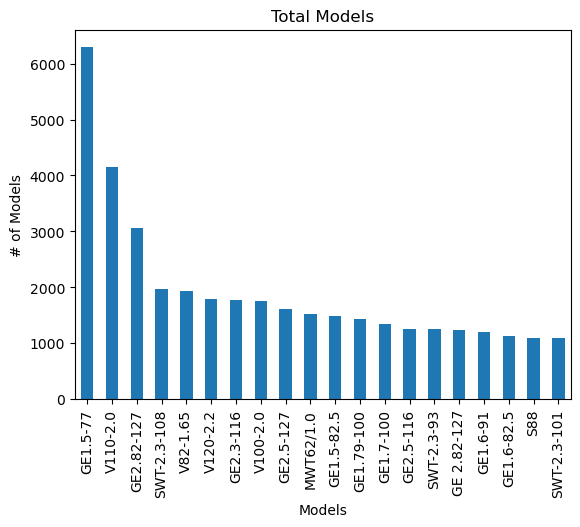

In [8]:
turbine_model = wind["t_model"].value_counts().head(20)
turbine_model

turbine_model.plot(kind="bar")

plt.title ('Total Models')
plt.xlabel('Models')
plt.ylabel('# of Models')

plt.show()

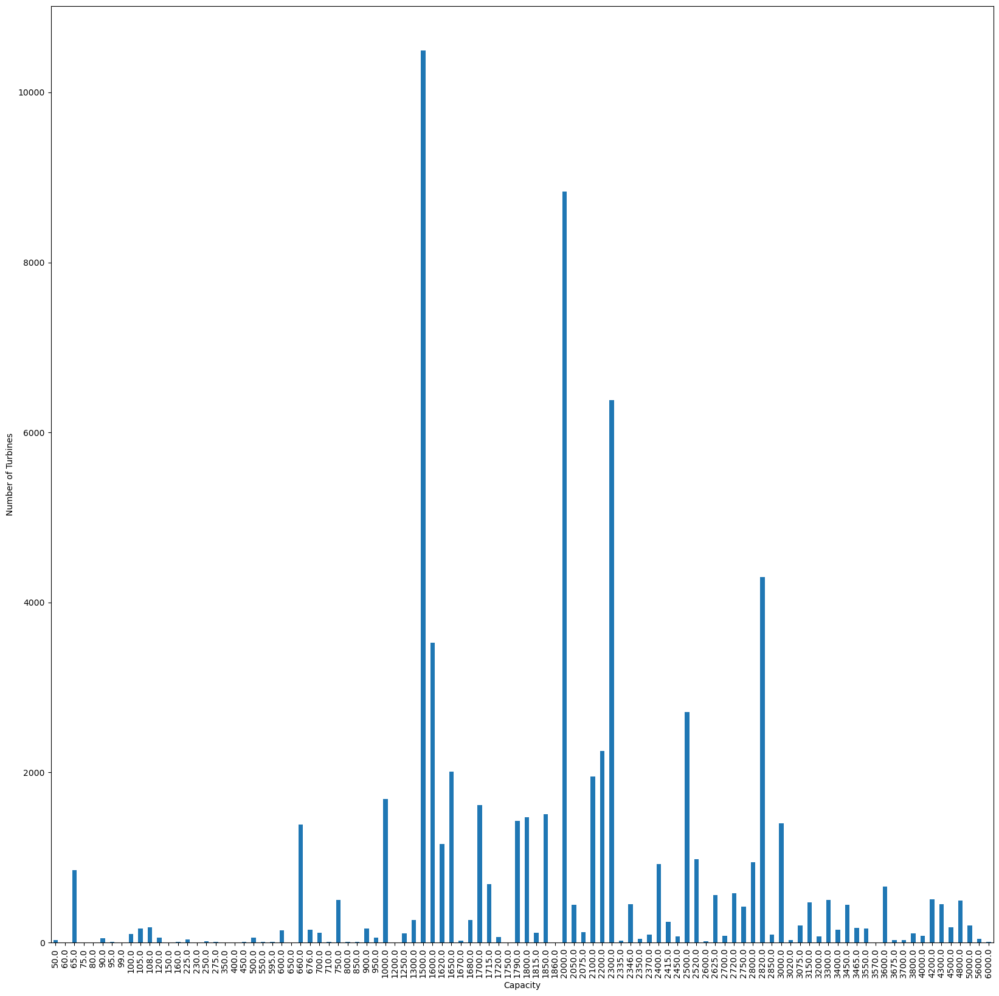

<Figure size 640x480 with 0 Axes>

In [116]:
#turbine_cap = wind_turbine_clean_df["Capacity"].count()
#print(turbine_cap)


turbine_cap = wind_turbine_clean_df.groupby(['Capacity'])
count_turbine = turbine_cap['Capacity'].count()
count_turbine

count_chart = count_turbine.plot(kind='bar', figsize=(20,20))


# Set the xlabel and ylabel using class methods
count_chart.set_xlabel("Capacity")
count_chart.set_ylabel("Number of Turbines")

plt.show()
plt.tight_layout()

#summary_table4 = pd.DataFrame(turbine_cap, index=[1])
#summary_table4

#turbine_cap.plot(kind='bar')


#bins= [500,1500,2000,2500,3000,3500,4000,4500,6000]
#plt.hist(summary_table4.values, bins=bins, edgecolor="k")
#plt.xticks(bins)
#plt.show()

#turbine_cap.plot(kind="bar")
#plt.xticks(rotation = 25)
#plt.title ('Capacity')
#plt.xlabel('Capacity')
#plt.ylabel('Count')

#plt.show()



  
#plt.hist(turbine_cap, bins=[0, 100, 500, 1000, 2000, 3000,4000,5000,6000],
         #edgecolor="green", color="grey")
  


GE Wind          32300
Vestas           17161
Siemens           5166
Gamesa            3037
Mitsubishi        2373
                 ...  
DWT                  1
Silver Eagle         1
Bergey Energy        1
Wincon               1
Unison               1
Name: Manufacturer, Length: 63, dtype: int64


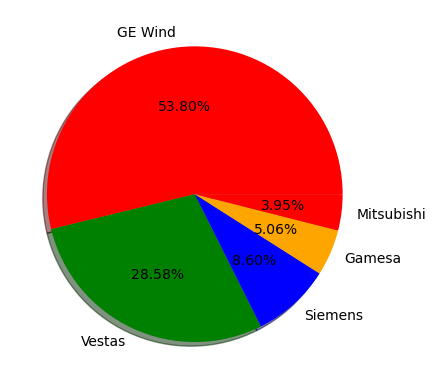

In [126]:
manu_pie = wind_turbine_clean_df['Manufacturer'].value_counts()
print(manu_pie)

labels = ["GE Wind", "Vestas", "Siemens","Gamesa", "Mitsubishi"]

#The values of each section of the pie chart
#Sizes were found using the print statement from the first step
sizes = [32300,17161,5166,3037,2373]

# The colors of each section of the pie chart
colors = ["red", "green","blue","orange"]

# Tells matplotlib to separate the "Humans" section from the others
explode = (0.1, 0, 0, 0)

plt.pie(sizes, labels=labels, colors=colors,
        autopct="%0.2f%%", shadow=True)


plt.show()

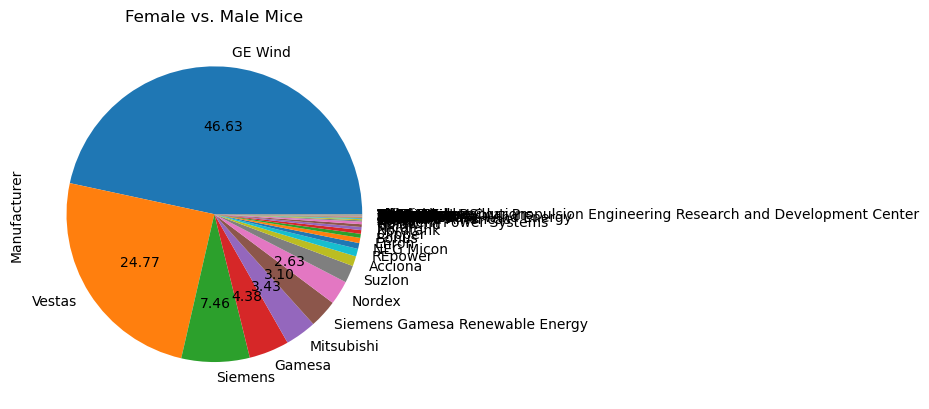

In [134]:
def autopct(pct): # only show the label when it's > 2%
    return ('%.2f' % pct) if pct > 2 else ''


manu_data = wind_turbine_clean_df["Manufacturer"].value_counts()
manu_data.plot.pie(autopct= autopct)
#manu_data.plot.pie(autopct= "%1.1f%%")
plt.title("Female vs. Male Mice")
plt.show()


#my_labels = ['Male', 'Female']
#my_labels = [{'Manufacturer'}]
#ax = wind_turbine_clean_df['Manufacturer'].value_counts().plot(kind='pie', figsize=(5,5), autopct=autopct, labels=None)

#ax.axes.get_yaxis().set_visible(False)
#plt.legend(loc=5, labels=my_labels)

#plt.title('Mouse Gender Population for Study')
#plt.show()

case_id    6293
p_name     6293
t_state    6293
p_year     6243
t_cap      6217
t_manu     6215
t_model    6215
t_hh       6214
xlong      6293
ylat       6293
dtype: int64

,case_id,p_name,t_state,p_year,t_cap,t_manu,t_model,t_hh,xlong,ylat
63,3049503,30 MW Iowa DG Portfolio,IA,2017.0,3000.0,Nordex,AW125/3000,87.5,-93.523651,42.006813
64,3049500,30 MW Iowa DG Portfolio,IA,2017.0,3000.0,Nordex,AW125/3000,87.5,-93.515892,42.016373
65,3049504,30 MW Iowa DG Portfolio,IA,2017.0,3000.0,Nordex,AW125/3000,87.5,-92.672089,41.742046
66,3057059,30 MW Iowa DG Portfolio,IA,2017.0,3000.0,Nordex,AW125/3000,87.5,-93.623009,41.881470
67,3063272,30 MW Iowa DG Portfolio,IA,2017.0,3000.0,Nordex,AW125/3000,87.5,-93.430367,42.028233


C:\Users\justi\anaconda3\lib\site-packages\pandas\plotting\_matplotlib\core.py:1259: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  scatter = ax.scatter(


<Axes: xlabel='p_year', ylabel='t_cap'>

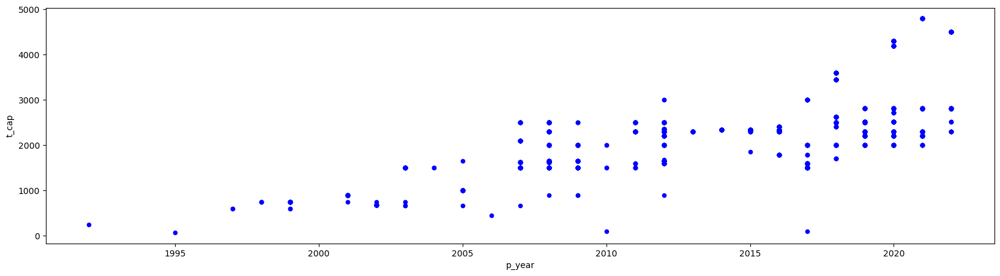

In [18]:
# Call the USWTDB API and apply custom URL parameters to the request.
#caTurbines_url = 'https://eersc.usgs.gov/api/uswtdb/v1/turbines?&t_state=eq.CA&t_cap=not.is.null&t_ttlh=not.is.null&select=p_year,t_manu,p_name,Capacity:t_cap,Height:t_ttlh,xlong,ylat'

#new_wind

ca_turbines = new_wind.loc[new_wind["t_state"] == "IA"]
ca_turbines

# Parse the JSON response from the API return and populate the dataframe
#caTurbines = pd.read_json(caTurbines_url)

# Display the number of turbines in our API return
display(ca_turbines.count())

# Preview the first 5 records of the return. Data should only include the attributes defined by our API request
display(ca_turbines.head(5))

# Generate a scatter plot with x-axis=year, y-axis=capacity, colorized (c) by height using 'viridis' matplotlib colormap
ca_turbines.plot.scatter(x='p_year',
                         y='t_cap',
                         c='blue',
                         colormap='viridis',
                         figsize=(20,5),
                         sharex=False)

p_year      3770
t_manu      3770
p_name      3770
Capacity    3770
Height      3770
xlong       3770
ylat        3770
dtype: int64

,p_year,t_manu,p_name,Capacity,Height,xlong,ylat
0,1995,Vestas,Alta Mesa,225,53.5,-116.65699,33.94109
1,2008,Vestas,Alite Wind Farm,3000,125.0,-118.33529,35.03770
2,2008,Vestas,Alite Wind Farm,3000,125.0,-118.34489,35.03090
3,2008,Vestas,Alite Wind Farm,3000,125.0,-118.33849,35.03659
4,2008,Vestas,Alite Wind Farm,3000,125.0,-118.33999,35.03600


<Axes: xlabel='p_year', ylabel='Capacity'>

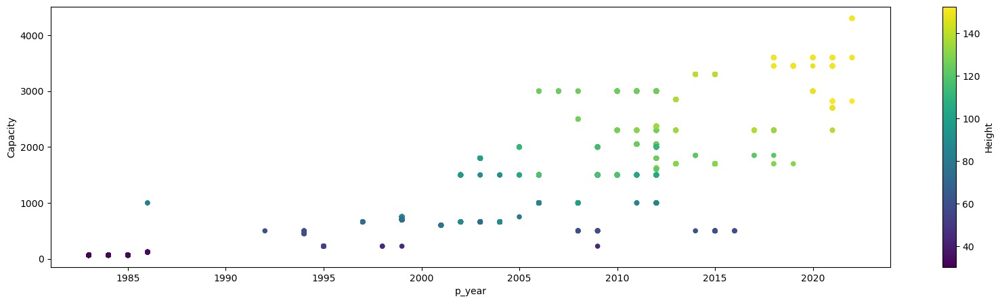

In [32]:
# Call the USWTDB API and apply custom URL parameters to the request.
caTurbines_url = 'https://eersc.usgs.gov/api/uswtdb/v1/turbines?&t_state=eq.CA&t_cap=not.is.null&t_ttlh=not.is.null&select=p_year,t_manu,p_name,Capacity:t_cap,Height:t_ttlh,xlong,ylat'

# Parse the JSON response from the API return and populate the dataframe
caTurbines = pd.read_json(caTurbines_url)

# Display the number of turbines in our API return
display(caTurbines.count())

# Preview the first 5 records of the return. Data should only include the attributes defined by our API request
display(caTurbines.head(5))

# Generate a scatter plot with x-axis=year, y-axis=capacity, colorized (c) by height using 'viridis' matplotlib colormap
caTurbines.plot.scatter(x='p_year',
                         y='Capacity',
                         c='Height',
                         colormap='viridis',
                         figsize=(20,5),
                         sharex=False)

In [20]:
# NGMDB monochorome style designed to provide a basemap that highlights the data overlay.
ngmdbLight = "https://ngmdb-tiles.usgs.gov/styles/ngmdb-light/style.json"

# NGMDB full-color style that contains standard cartographic basemap layers, contour lines, and hillshading.
ngmdbBasemap = "https://ngmdb-tiles.usgs.gov/styles/ngmdb-tv/style.json"

In [21]:
# Call the USWTDB API and apply custom URL parameters to the request. Parameters allow us to filter the data return.
data_url = "https://eersc.usgs.gov/api/uswtdb/v1/turbines?&t_cap=gt.0&select=case_id,t_manu,t_cap,xlong,ylat"

# Parse the JSON response from the API return and populate the dataframe
dfClusterMap = pd.read_json(data_url)

# Preview the first five records of our dataframe based on the custom URL paramters in the API request
dfClusterMap.head(5)

turbineClusterGeoJson = df_to_geojson(
    dfClusterMap,
    properties=["case_id", "t_cap", "t_manu"],
    precision=3,
    lat="ylat",
    lon="xlong",
)

# Define our color stops based on a 6-step divergent color ramp
turbine_color_stops = create_color_stops(
    [10, 50, 100, 500, 1000, 5000], colors="Spectral"
)

# Define the radius (sizes) of the cluster markers
turbine_radius_stops = [[1, 5], [10, 10], [1000, 15], [5000, 20]]

# Define the parameters for our cluster map
# Call our NGMDB style as basemap, set the max zoom level for clusters to show
# Set cluster label sizze and cluster symbol opacity
# Handle initial zoom/center of visualization
turbineClustersMap = ClusteredCircleViz(
    turbineClusterGeoJson,
    color_stops=turbine_color_stops,
    radius_stops=turbine_radius_stops,
    style=ngmdbLight,
    cluster_maxzoom=10,
    label_size=10,
    opacity=0.6,
    center=(-95, 40),
    zoom=3.25,
)

# Render the cluster map visualization
turbineClustersMap.show()

C:\Users\justi\anaconda3\lib\site-packages\IPython\core\display.py:431: UserWarning: Consider using IPython.display.IFrame instead
  warnings.warn("Consider using IPython.display.IFrame instead")


Capacity    267
dtype: int64

,Capacity
0,2100
1,2100
2,2100
3,2100
4,2100


<Axes: ylabel='Frequency'>

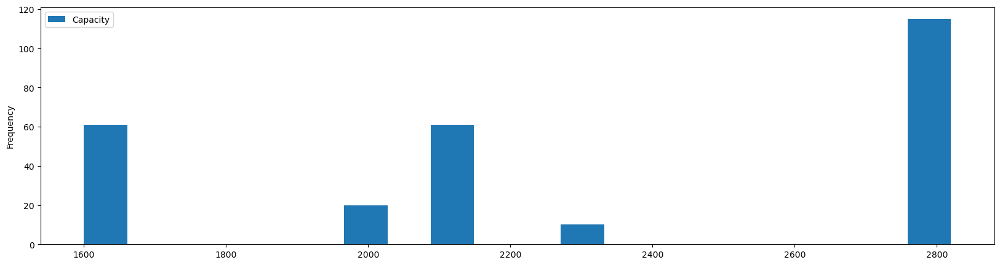

In [36]:
# Call the USWTDB API and apply custom URL parameters to the request
caCapHist_url = 'https://eersc.usgs.gov/api/uswtdb/v1/turbines?&t_state=eq.AZ&t_cap=not.is.null&select=Capacity:t_cap'

# Parse the JSON response from the API return and populate the dataframe
capHist = pd.read_json(caCapHist_url)

#Display the number of turbines in our API return
display(capHist.count())

#Preview the first 5 records of the return. Data should only include the single attribute "Capacity" as defined by our API request
display(capHist.head(5))

# Generate a histogram showing frequencies of wind turbine capacities. Include number of bins, and size of the plot
capHist.plot.hist(bins=20,
                  figsize=(20,5))

In [ ]:
#Capomulin
ge_line = wind.loc[wind['t_manu'] == 'GE Wind']
capomulin_line

#specific capomulin data for Mousel509
GE_Model = ge_line.loc[ge_line['t_model']== 'GE1.5-77']
print(G)

#Line graph 
plt.plot(mousedata['Timepoint'], mousedata['Tumor Volume (mm3)'])
plt.xlabel('Timepoint (days)')
plt.ylabel('Tumour Volume (mm3)')
plt.title('Capomulin treatment of mouse l509')
plt.show()

In [5]:
# Our data should be uniquely identified by Turbine ID and Longitude
# Get duplicate turbine by ID number, if any. 
duplicate_turbine = wind.loc[wind.duplicated(subset=['case_id', 'xlong',]),'case_id'].unique()
duplicate_turbine

array([], dtype=int64)

In [142]:
#Delete
# Optional: Get all the data for the duplicate mouse ID. 
Mouseg989 = pymaceuticals_complete.loc[pymaceuticals_complete['Mouse ID'] == 'g989',:]
Mouseg989

,Mouse ID,Drug Regimen,Sex,Age_months,Weight (g),Timepoint,Tumor Volume (mm3),Metastatic Sites
908,g989,Propriva,Female,21,26,0,45.000000,0
909,g989,Propriva,Female,21,26,0,45.000000,0
910,g989,Propriva,Female,21,26,5,48.786801,0
911,g989,Propriva,Female,21,26,5,47.570392,0
912,g989,Propriva,Female,21,26,10,51.745156,0
913,g989,Propriva,Female,21,26,10,49.880528,0
914,g989,Propriva,Female,21,26,15,51.325852,1
915,g989,Propriva,Female,21,26,15,53.442020,0
916,g989,Propriva,Female,21,26,20,55.326122,1
917,g989,Propriva,Female,21,26,20,54.657650,1


In [143]:
#Delete
# Create a clean DataFrame by dropping the duplicate mouse by its ID.
pymaceuticals_clean = pymaceuticals_complete.drop(pymaceuticals_complete[pymaceuticals_complete['Mouse ID'] == 'g989'].index)
pymaceuticals_clean

,Mouse ID,Drug Regimen,Sex,Age_months,Weight (g),Timepoint,Tumor Volume (mm3),Metastatic Sites
0,k403,Ramicane,Male,21,16,0,45.000000,0
1,k403,Ramicane,Male,21,16,5,38.825898,0
2,k403,Ramicane,Male,21,16,10,35.014271,1
3,k403,Ramicane,Male,21,16,15,34.223992,1
4,k403,Ramicane,Male,21,16,20,32.997729,1
...,...,...,...,...,...,...,...,...
1888,z969,Naftisol,Male,9,30,25,63.145652,2
1889,z969,Naftisol,Male,9,30,30,65.841013,3
1890,z969,Naftisol,Male,9,30,35,69.176246,4
1891,z969,Naftisol,Male,9,30,40,70.314904,4


In [144]:
# Checking the number of mice in the clean DataFrame.
mice_count_clean = len(pd.unique(pymaceuticals_clean['Mouse ID']))
mice_count_clean

248

## Summary Statistics

In [17]:
# Generate a summary statistics table of mean, median, variance, standard deviation, and SEM of the tumor volume for each regimen

# Use groupby and summary statistical methods to calculate the following properties of each drug regimen: 
# mean, median, variance, standard deviation, and SEM of the tumor volume. 
# Assemble the resulting series into a single summary DataFrame.

#summary_df = wind.groupby('t_manu')

# Calculate the mean, median, standard deviation, and sem for each drug
#state_mean = summary_df['t_manu'].mean()
#tumor_median = summary_df['Tumor Volume (mm3)'].median()
#tumor_stdev = summary_df['Tumor Volume (mm3)'].std()
#tumor_sem = summary_df['Tumor Volume (mm3)'].sem()

# Create DataFrame to summarize calculations
#summary_grouped_df = pd.DataFrame({'Mean': tumor_mean, 'Median': tumor_median,
                                   #'Standard Deviation': tumor_stdev, 'SEM': tumor_sem})

#summary_grouped_df.head()
#his method does not produce the warning errors for numeric calcuations

turbine_mean = wind.groupby("t_manu").mean()["t_cap"]
turbine_median = wind.groupby("t_manu").median()["t_cap"]
turbine_variance = wind.groupby("t_manu").var()["t_cap"]
turbine_std = wind.groupby('t_manu').std()["t_cap"]
turbine_sem = wind.groupby('t_manu').sem()["t_cap"]


summary_table = pd.DataFrame({"Mean Capacity": turbine_mean, 
                             "Median Capacity":turbine_median, 
                             "Var Capacity":turbine_variance, 
                             "STD Capacity": turbine_std, 
                             "STEM Capacity": turbine_sem
                             })

summary_table_1

summary_table_1.sort_values(by='Mean Capacity', ascending=False)
#This method produces a warning error 'numeric_only will default to False. 
#Either specify numeric_only or select only columns which should be valid for the function.'
#It appers all drug_regimens are returned here, whereas the previous summary table did not list out
#all drug regimens.



C:\Users\justi\AppData\Local\Temp\ipykernel_2904\850397770.py:22: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  turbine_mean = wind.groupby("t_manu").mean()["t_cap"]
C:\Users\justi\AppData\Local\Temp\ipykernel_2904\850397770.py:23: FutureWarning: The default value of numeric_only in DataFrameGroupBy.median is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  turbine_median = wind.groupby("t_manu").median()["t_cap"]
C:\Users\justi\AppData\Local\Temp\ipykernel_2904\850397770.py:24: FutureWarning: The default value of numeric_only in DataFrameGroupBy.var is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should b

,Mean Capacity,Median Capacity,Var Capacity,STD Capacity,STEM Capacity
t_manu,,,,,
Goldwind Americas,4200.000000,4200.0,0.000000e+00,0.000000,0.000000
China Creative Wind Energy,3600.000000,3600.0,0.000000e+00,0.000000,0.000000
Nordex,3407.620746,3150.0,6.927172e+05,832.296322,19.498616
Siemens Gamesa Renewable Energy,2880.290308,2625.0,1.375639e+06,1172.876509,25.318468
Kenersys,2500.000000,2500.0,0.000000e+00,0.000000,0.000000
...,...,...,...,...,...
Seaforth,64.583333,65.0,2.083333e+00,1.443376,0.416667
AOC,55.000000,50.0,5.454545e+01,7.385489,2.132007
Bergey Energy,50.000000,50.0,NaN,NaN,NaN


In [35]:
n_by_state = wind.groupby(["t_manu","t_state","t_model","t_cap"])["case_id"].count()

summary_table = pd.DataFrame({"Manu_Model": n_by_state
                             })
#summary_table.head(10)

summary_table.sort_values(by='Manu_Model', ascending=False)

Manu_Model
t_manu     t_state t_model    t_cap             
GE Wind    TX      GE1.5-77   1500.0         999
Vestas     IA      V110-2.0   2000.0         939
GE Wind    TX      GE2.82-127 2820.0         850
Mitsubishi TX      MWT62/1.0  1000.0         821
GE Wind    TX      GE1.79-100 1790.0         774
...                                          ...
Nordex     OH      N54        1000.0           1
           MN      N90        2500.0           1
           IA      N43        600.0            1
NEG Micon  UT      M700/225   225.0            1
Zond       VT      Z40        1000.0           1

[1008 rows x 1 columns]

In [81]:
# A more advanced method to generate a summary statistics table of mean, median, variance, standard deviation,
# and SEM of the tumor volume for each regimen (only one method is required in the solution)

# Using the aggregation method, produce the same summary statistics in a single line
summary_table_2 = pymaceuticals_clean.groupby(['Drug Regimen']).agg({"Tumor Volume (mm3)":["mean","median","var","std","sem"]})
summary_table_2

Tumor Volume (mm3)                                          
                           mean     median        var       std       sem
Drug Regimen                                                             
Capomulin             40.675741  41.557809  24.947764  4.994774  0.329346
Ceftamin              52.591172  51.776157  39.290177  6.268188  0.469821
Infubinol             52.884795  51.820584  43.128684  6.567243  0.492236
Ketapril              55.235638  53.698743  68.553577  8.279709  0.603860
Naftisol              54.331565  52.509285  66.173479  8.134708  0.596466
Placebo               54.033581  52.288934  61.168083  7.821003  0.581331
Propriva              52.320930  50.446266  43.852013  6.622085  0.544332
Ramicane              40.216745  40.673236  23.486704  4.846308  0.320955
Stelasyn              54.233149  52.431737  59.450562  7.710419  0.573111
Zoniferol             53.236507  51.818479  48.533355  6.966589  0.516398

## Bar and Pie Charts

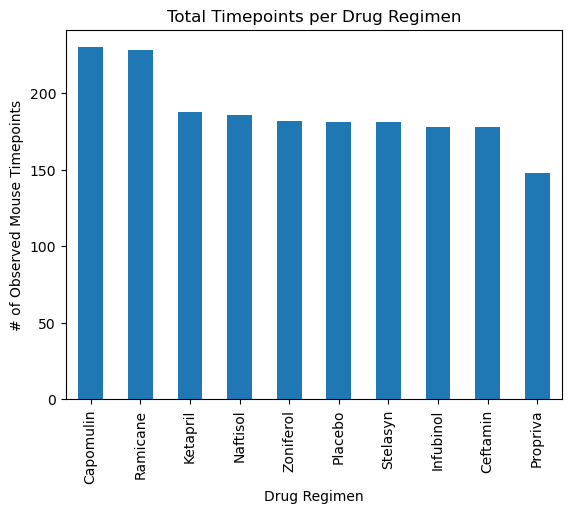

In [94]:
# Generate a bar plot showing the total number of rows (Mouse ID/Timepoints) for each drug regimen using Pandas.

regimen_bar = pymaceuticals_clean['Drug Regimen'].value_counts()
regimen_bar

regimen_bar.plot(kind="bar")

plt.title ('Total Timepoints per Drug Regimen')
plt.xlabel('Drug Regimen')
plt.ylabel('# of Observed Mouse Timepoints')

plt.show()

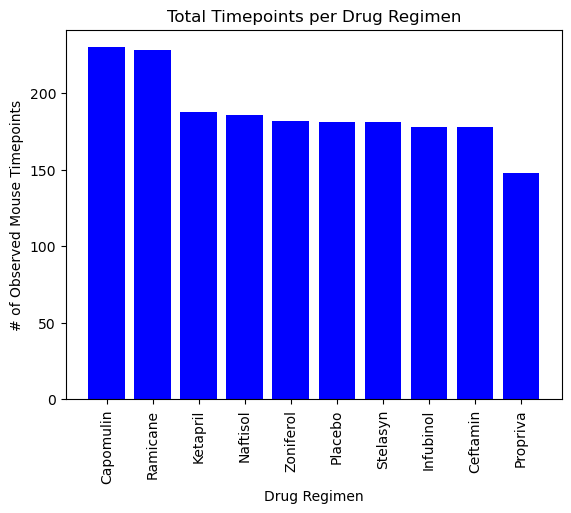

In [110]:
# Generate a bar plot showing the total number of rows (Mouse ID/Timepoints) for each drug regimen using pyplot.

#Use value count to find the number for each Drug Regimen
regimen_bar = pymaceuticals_clean['Drug Regimen'].value_counts()

x_axis = regimen_bar.index.values
y_axis = regimen_bar.values

#x_axis = np.arange(len(pymaceuticals_clean))
#tick_locations = [value for value in x_axis]

plt.bar(x_axis,y_axis, color='b', alpha=1.0, align="center")
plt.xticks(rotation ='vertical')

plt.title ('Total Timepoints per Drug Regimen')
plt.xlabel('Drug Regimen')
plt.ylabel('# of Observed Mouse Timepoints')

plt.show()

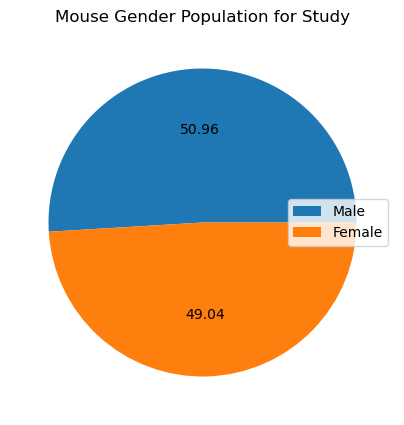

In [120]:
# Generate a pie plot showing the distribution of female versus male mice using Pandas
# Labels for the sections of our pie chart

def autopct(pct): # only show the label when it's > 10%
    return ('%.2f' % pct) if pct > 10 else ''

my_labels = ['Male', 'Female']
ax = pymaceuticals_clean['Sex'].value_counts().plot(kind='pie', figsize=(5,5), autopct=autopct, labels=None)

ax.axes.get_yaxis().set_visible(False)
plt.legend(loc=5, labels=my_labels)

plt.title('Mouse Gender Population for Study')
plt.show()

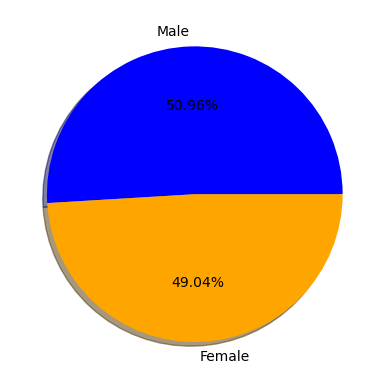

In [129]:
# Generate a pie plot showing the distribution of female versus male mice using pyplot

sex = pymaceuticals_clean['Sex'].value_counts()
#print(sex)

labels = ["Male", "Female"]

# The values of each section of the pie chart
#Sizes were found using the print statement from the first step
sizes = [958,922]

# The colors of each section of the pie chart
colors = ["blue", "orange"]

# Tells matplotlib to separate the "Humans" section from the others
#explode = (0.1, 0, 0, 0)

plt.pie(sizes, labels=labels, colors=colors,
        autopct="%0.2f%%", shadow=True)


plt.show()

## Quartiles, Outliers and Boxplots

In [13]:
# Calculate the final tumor volume of each mouse across four of the treatment regimens:  
# Capomulin, Ramicane, Infubinol, and Ceftamin

# Start by getting the last (greatest) timepoint for each mouse


# Merge this group df with the original DataFrame to get the tumor volume at the last timepoint


In [14]:
# Put treatments into a list for for loop (and later for plot labels)


# Create empty list to fill with tumor vol data (for plotting)


# Calculate the IQR and quantitatively determine if there are any potential outliers. 

    
    # Locate the rows which contain mice on each drug and get the tumor volumes

    
    # add subset 

    
    # Determine outliers using upper and lower bounds


Capomulin's potential outliers: Series([], Name: Tumor Volume (mm3), dtype: float64)
Ramicane's potential outliers: Series([], Name: Tumor Volume (mm3), dtype: float64)
Infubinol's potential outliers: 31    36.321346
Name: Tumor Volume (mm3), dtype: float64
Ceftamin's potential outliers: Series([], Name: Tumor Volume (mm3), dtype: float64)


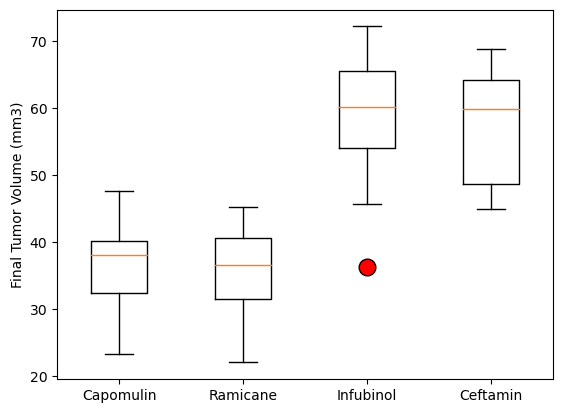

In [15]:
# Generate a box plot that shows the distrubution of the tumor volume for each treatment group.


## Line and Scatter Plots

    Mouse ID Drug Regimen   Sex  Age_months  Weight (g)  Timepoint  \
371     l509    Capomulin  Male          17          21          0   
372     l509    Capomulin  Male          17          21          5   
373     l509    Capomulin  Male          17          21         10   
374     l509    Capomulin  Male          17          21         15   
375     l509    Capomulin  Male          17          21         20   
376     l509    Capomulin  Male          17          21         25   
377     l509    Capomulin  Male          17          21         30   
378     l509    Capomulin  Male          17          21         35   
379     l509    Capomulin  Male          17          21         40   
380     l509    Capomulin  Male          17          21         45   

     Tumor Volume (mm3)  Metastatic Sites  
371           45.000000                 0  
372           45.851193                 0  
373           46.759074                 0  
374           47.488599                 1  
375      

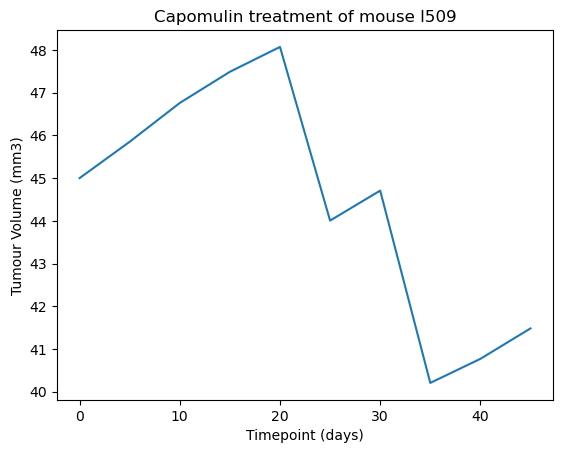

In [156]:
# Generate a line plot of tumor volume vs. time point for a single mouse treated with Capomulin

#Capomulin
capomulin_line = pymaceuticals_clean.loc[pymaceuticals_clean['Drug Regimen'] == 'Capomulin']
capomulin_line

#specific capomulin data for Mousel509
mousel509 = capomulin_line.loc[capomulin_line['Mouse ID']== 'l509']
print(mousel509)

#Line graph 
plt.plot(mousedata['Timepoint'], mousedata['Tumor Volume (mm3)'])
plt.xlabel('Timepoint (days)')
plt.ylabel('Tumour Volume (mm3)')
plt.title('Capomulin treatment of mouse l509')
plt.show()

C:\Users\justi\AppData\Local\Temp\ipykernel_17616\2914462553.py:7: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  mouseweight = capomulin_line.groupby(['Mouse ID']).mean()


          Age_months  Weight (g)  Timepoint  Tumor Volume (mm3)  \
Mouse ID                                                          
b128             9.0        22.0       22.5           41.963636   
b742             7.0        21.0       22.5           40.083699   
f966            16.0        17.0       10.0           36.505973   
g288             3.0        19.0       22.5           41.990097   
g316            22.0        22.0       22.5           44.613344   
i557             1.0        24.0       22.5           44.805810   
i738            23.0        20.0       22.5           39.141053   
j119             7.0        23.0       22.5           44.465236   
j246            21.0        21.0       17.5           43.216925   
l509            17.0        21.0       22.5           44.434474   
l897            17.0        19.0       22.5           42.507261   
m601            22.0        17.0       22.5           34.847470   
m957             3.0        19.0       22.5           39.04981

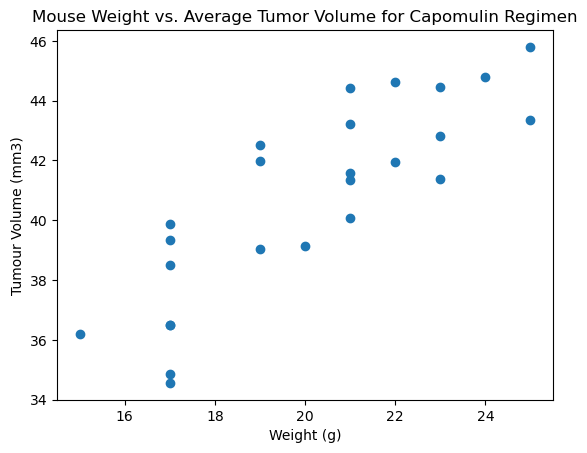

In [166]:
# Generate a scatter plot of mouse weight vs. the average observed tumor volume for the entire Capomulin regimen
#Capomulin

#Isolate clean dataset for Capomulin
capomulin_line = pymaceuticals_clean.loc[pymaceuticals_clean['Drug Regimen'] == 'Capomulin']
capomulin_line

#Calculate mean data for mouse ids with Capomulin
mouseweight = capomulin_line.groupby(['Mouse ID']).mean()
print(mouseweight)

#Scatter plot for Weight and Tumor Volume
plt.scatter(mouseweight['Weight (g)'], mouseweight['Tumor Volume (mm3)'])

#Scatter plot labels
plt.title('Mouse Weight vs. Average Tumor Volume for Capomulin Regimen')
plt.xlabel('Weight (g)')
plt.ylabel('Tumour Volume (mm3)')
plt.show()

## Correlation and Regression

The correlation between mouse weight and the average tumor volume is 0.84


C:\Users\justi\AppData\Local\Temp\ipykernel_17616\1975389741.py:20: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  mouseweight = capomulin_line.groupby(['Mouse ID']).mean()


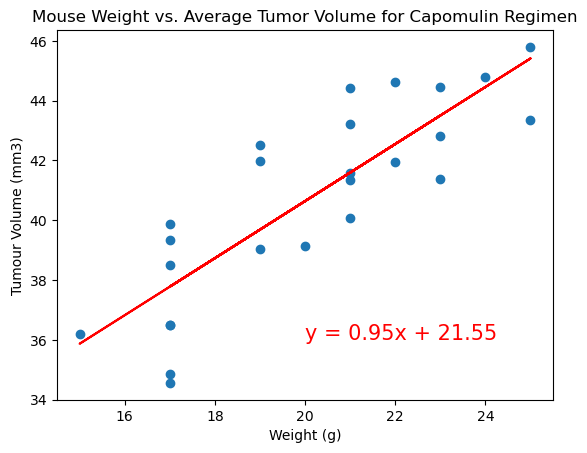

In [190]:
# Calculate the correlation coefficient and a linear regression model 
# for mouse weight and average observed tumor volume for the entire Capomulin regimen

#Example pulled for correlation calculation. Does not however get mean numbers.
#tumor = pymaceuticals_clean.iloc[:,6]
#print(tumor)
#weight = pymaceuticals_clean.iloc[:,4]
#correlation = st.pearsonr(tumor,weight)

#Calculate correlation using mean data
correlation=st.pearsonr(mouseweight['Weight (g)'],mouseweight['Tumor Volume (mm3)'])
#print(corr)

print(f"The correlation between mouse weight and the average tumor volume is {round(correlation[0],2)}")

#Isolate clean dataset for Capomulin
capomulin_line = pymaceuticals_clean.loc[pymaceuticals_clean['Drug Regimen'] == 'Capomulin']
capomulin_line

#Calculate mean data for mouse ids with Capomulin
mouseweight = capomulin_line.groupby(['Mouse ID']).mean()
#print(mouseweight)

x_values = mouseweight['Weight (g)']
y_values = mouseweight['Tumor Volume (mm3)']
(slope, intercept, rvalue, pvalue, stderr) = linregress(x_values, y_values)
regress_values = x_values * slope + intercept
line_eq = "y = " + str(round(slope,2)) + "x + " + str(round(intercept,2))
plt.scatter(x_values,y_values)
plt.plot(x_values,regress_values,"r-")
plt.annotate(line_eq,(20,36),fontsize=15,color="red")

plt.title('Mouse Weight vs. Average Tumor Volume for Capomulin Regimen')
plt.xlabel('Weight (g)')
plt.ylabel('Tumour Volume (mm3)')
plt.show()
